In [1]:
import pandas as pd
import numpy as np 
import matplotlib.pyplot as pyplot
import seaborn as sns

In [2]:
%matplotlib inline 

In [3]:
data = pd.read_csv("Amazon Sale Report.csv",encoding = 'latin-1')

In [4]:
data

,index,Order ID,Date,Status,Fulfilment,Sales Channel,ship-service-level,Category,Size,Courier Status,...,currency,Amount,ship-city,ship-state,ship-postal-code,ship-country,B2B,fulfilled-by,New,PendingS
0,0,405-8078784-5731545,04-30-22,Cancelled,Merchant,Amazon.in,Standard,T-shirt,S,On the Way,...,INR,647.62,MUMBAI,MAHARASHTRA,400081.0,IN,False,Easy Ship,NaN,NaN
1,1,171-9198151-1101146,04-30-22,Shipped - Delivered to Buyer,Merchant,Amazon.in,Standard,Shirt,3XL,Shipped,...,INR,406.00,BENGALURU,KARNATAKA,560085.0,IN,False,Easy Ship,NaN,NaN
2,2,404-0687676-7273146,04-30-22,Shipped,Amazon,Amazon.in,Expedited,Shirt,XL,Shipped,...,INR,329.00,NAVI MUMBAI,MAHARASHTRA,410210.0,IN,True,NaN,NaN,NaN
3,3,403-9615377-8133951,04-30-22,Cancelled,Merchant,Amazon.in,Standard,Blazzer,L,On the Way,...,INR,753.33,PUDUCHERRY,PUDUCHERRY,605008.0,IN,False,Easy Ship,NaN,NaN
4,4,407-1069790-7240320,04-30-22,Shipped,Amazon,Amazon.in,Expedited,Trousers,3XL,Shipped,...,INR,574.00,CHENNAI,TAMIL NADU,600073.0,IN,False,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
128971,128970,406-6001380-7673107,05-31-22,Shipped,Amazon,Amazon.in,Expedited,Shirt,XL,Shipped,...,INR,517.00,HYDERABAD,TELANGANA,500013.0,IN,False,NaN,NaN,NaN
128972,128971,402-9551604-7544318,05-31-22,Shipped,Amazon,Amazon.in,Expedited,T-shirt,M,Shipped,...,INR,999.00,GURUGRAM,HARYANA,122004.0,IN,False,NaN,NaN,NaN
128973,128972,407-9547469-3152358,05-31-22,Shipped,Amazon,Amazon.in,Expedited,Blazzer,XXL,Shipped,...,INR,690.00,HYDERABAD,TELANGANA,500049.0,IN,False,NaN,NaN,NaN
128974,128973,402-6184140-0545956,05-31-22,Shipped,Amazon,Amazon.in,Expedited,T-shirt,XS,Shipped,...,INR,1199.00,Halol,Gujarat,389350.0,IN,False,NaN,NaN,NaN


In [5]:
data.columns

Index(['index', 'Order ID', 'Date', 'Status', 'Fulfilment', 'Sales Channel',
       'ship-service-level', 'Category', 'Size', 'Courier Status', 'Qty',
       'currency', 'Amount', 'ship-city', 'ship-state', 'ship-postal-code',
       'ship-country', 'B2B', 'fulfilled-by', 'New', 'PendingS'],
      dtype='object')

In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 128976 entries, 0 to 128975
Data columns (total 21 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   index               128976 non-null  int64  
 1   Order ID            128976 non-null  object 
 2   Date                128976 non-null  object 
 3   Status              128976 non-null  object 
 4   Fulfilment          128976 non-null  object 
 5   Sales Channel       128976 non-null  object 
 6   ship-service-level  128976 non-null  object 
 7   Category            128976 non-null  object 
 8   Size                128976 non-null  object 
 9   Courier Status      128976 non-null  object 
 10  Qty                 128976 non-null  int64  
 11  currency            121176 non-null  object 
 12  Amount              121176 non-null  float64
 13  ship-city           128941 non-null  object 
 14  ship-state          128941 non-null  object 
 15  ship-postal-code    128941 non-nul

In [8]:
data['Date'] = pd.to_datetime(data['Date'])

In [9]:
data['ship-city'] = data['ship-city'].astype(str)
data['ship-state'] = data['ship-state'].astype(str)
data['Category'] = data['Category'].astype(str)
data['Sales Channel'] = data['Sales Channel'].astype(str)

In [10]:
data[['Qty', 'Amount',]].describe()

,Qty,Amount
count,128976.000000,121176.000000
mean,0.904401,648.562176
std,0.313368,281.185041
min,0.000000,0.000000
25%,1.000000,449.000000
50%,1.000000,605.000000
75%,1.000000,788.000000
max,15.000000,5584.000000


In [11]:
data['Order Month'] = data['Date'].dt.month
data['Order Year'] = data['Date'].dt.year
data['Order Date MonthYear'] = data['Date'].dt.strftime('%Y-%m')
data = data.drop(columns=['Date'])

In [12]:
df = data

In [13]:
df.isnull().sum()

index                        0
Order ID                     0
Status                       0
Fulfilment                   0
Sales Channel                0
ship-service-level           0
Category                     0
Size                         0
Courier Status               0
Qty                          0
currency                  7800
Amount                    7800
ship-city                    0
ship-state                   0
ship-postal-code            35
ship-country                35
B2B                          0
fulfilled-by             89713
New                     128976
PendingS                128976
Order Month                  0
Order Year                   0
Order Date MonthYear         0
dtype: int64

In [14]:
pd.set_option('display.max_rows', None)
df['ship-state'].value_counts()

ship-state
MAHARASHTRA               22272
KARNATAKA                 17324
TAMIL NADU                11488
TELANGANA                 11330
UTTAR PRADESH             10646
DELHI                      6778
KERALA                     6577
WEST BENGAL                5962
ANDHRA PRADESH             5427
Gujarat                    4482
HARYANA                    4410
RAJASTHAN                  2652
MADHYA PRADESH             2532
ODISHA                     2115
BIHAR                      2085
PUNJAB                     1871
ASSAM                      1664
UTTARAKHAND                1552
JHARKHAND                  1457
GOA                        1102
CHHATTISGARH                909
HIMACHAL PRADESH            789
JAMMU & KASHMIR             702
PUDUCHERRY                  347
CHANDIGARH                  323
MANIPUR                     309
ANDAMAN & NICOBAR           256
MEGHALAYA                   204
SIKKIM                      202
NAGALAND                    184
Delhi                       1

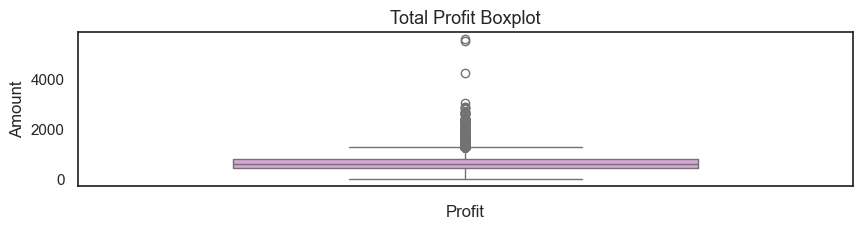

In [15]:
import matplotlib.pyplot as plt
sns.set(style='white')
fig, ax = plt.subplots(figsize=(10, 2))
sns.boxplot(data['Amount'], color="plum", width=.6)

plt.title('Total Profit Boxplot', fontsize=13)
plt.xlabel('Profit')
plt.show()

In [16]:
def detect_outliers(dataframe, column):
    threshold = 2     ## 2rd standard deviation
    mean = np.mean(column)
    std = np.std(column)
    outliers = []

    for i, value in enumerate(column):
        z_score = (value - mean) / std
        if np.abs(z_score) > threshold:
            outliers.append(i)
            print(dataframe.loc[i])

    return outliers

In [17]:
outliers = detect_outliers(df, df["Amount"])

index                                             32
Order ID                         404-9632124-1107550
Status                  Shipped - Delivered to Buyer
Fulfilment                                  Merchant
Sales Channel                              Amazon.in
ship-service-level                          Standard
Category                                     T-shirt
Size                                               M
Courier Status                               Shipped
Qty                                                1
currency                                         INR
Amount                                        1233.0
ship-city                              VISAKHAPATNAM
ship-state                            ANDHRA PRADESH
ship-postal-code                            530016.0
ship-country                                      IN
B2B                                            False
fulfilled-by                               Easy Ship
New                                           

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



index                                 96727
Order ID                408-8168399-9517153
Status                  Shipped - Picked Up
Fulfilment                         Merchant
Sales Channel                     Amazon.in
ship-service-level                 Standard
Category                            T-shirt
Size                                    XXL
Courier Status                      Shipped
Qty                                       1
currency                                INR
Amount                                  0.0
ship-city                              PUNE
ship-state                      MAHARASHTRA
ship-postal-code                   411046.0
ship-country                             IN
B2B                                   False
fulfilled-by                      Easy Ship
New                                     NaN
PendingS                                NaN
Order Month                               6
Order Year                             2022
Order Date MonthYear            

In [18]:
print(outliers)

[32, 80, 102, 146, 213, 227, 244, 252, 266, 300, 309, 319, 325, 350, 375, 386, 389, 393, 399, 417, 437, 442, 447, 450, 520, 528, 542, 567, 582, 618, 638, 648, 678, 682, 730, 732, 735, 754, 804, 816, 828, 845, 901, 903, 931, 944, 948, 956, 986, 987, 999, 1014, 1019, 1072, 1105, 1111, 1116, 1122, 1149, 1227, 1242, 1244, 1255, 1260, 1280, 1282, 1298, 1313, 1318, 1411, 1435, 1459, 1471, 1492, 1550, 1582, 1584, 1590, 1648, 1649, 1697, 1710, 1746, 1780, 1802, 1803, 1812, 1813, 1816, 1849, 1852, 1855, 1909, 1918, 1925, 1933, 1944, 1954, 1955, 1968, 2037, 2039, 2043, 2079, 2127, 2140, 2165, 2185, 2215, 2247, 2270, 2277, 2296, 2325, 2396, 2403, 2407, 2410, 2411, 2417, 2462, 2471, 2480, 2522, 2525, 2527, 2534, 2539, 2565, 2572, 2602, 2625, 2629, 2643, 2766, 2769, 2774, 2792, 2797, 2810, 2860, 2904, 2913, 2921, 2946, 3020, 3022, 3027, 3036, 3049, 3094, 3107, 3114, 3116, 3121, 3129, 3140, 3207, 3216, 3290, 3299, 3328, 3330, 3383, 3425, 3427, 3460, 3461, 3483, 3489, 3517, 3523, 3535, 3537, 3558, 35

In [19]:
list_length = len(outliers)

print("The list has", list_length, "outliers in Total Profit column of dataframe data ")

The list has 7088 outliers in Total Profit column of dataframe data 


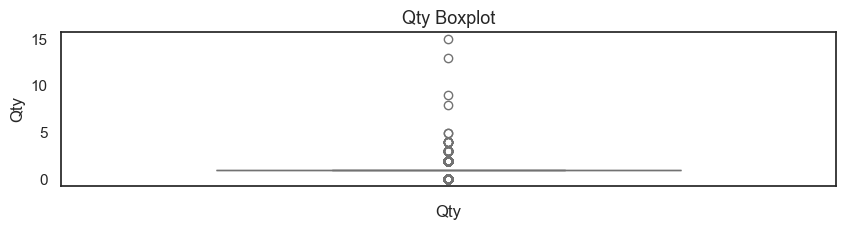

In [20]:
sns.set(style='white')
fig, ax = plt.subplots(figsize=(10, 2))
sns.boxplot(data['Qty'], color="plum", width=.6)

plt.title('Qty Boxplot', fontsize=13)
plt.xlabel('Qty')
plt.show()

In [21]:
def detect_outliers(dataframe, column):
    threshold = 2     ## 3rd standard deviation
    mean = np.mean(column)
    std = np.std(column)
    outliers = []

    for i, value in enumerate(column):
        z_score = (value - mean) / std
        if np.abs(z_score) > threshold:
            outliers.append(i)
            print(dataframe.loc[i])

    return outliers

In [22]:
outliers = detect_outliers(df, df["Qty"])

index                                     0
Order ID                405-8078784-5731545
Status                            Cancelled
Fulfilment                         Merchant
Sales Channel                     Amazon.in
ship-service-level                 Standard
Category                            T-shirt
Size                                      S
Courier Status                   On the Way
Qty                                       0
currency                                INR
Amount                               647.62
ship-city                            MUMBAI
ship-state                      MAHARASHTRA
ship-postal-code                   400081.0
ship-country                             IN
B2B                                   False
fulfilled-by                      Easy Ship
New                                     NaN
PendingS                                NaN
Order Month                               4
Order Year                             2022
Order Date MonthYear            

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



index                                 49521
Order ID                404-4526346-2213169
Status                            Cancelled
Fulfilment                         Merchant
Sales Channel                     Amazon.in
ship-service-level                 Standard
Category                            T-shirt
Size                                    3XL
Courier Status                   On the Way
Qty                                       0
currency                                INR
Amount                              1338.39
ship-city                    ERODE DISTRICT
ship-state                       TAMIL NADU
ship-postal-code                   638311.0
ship-country                             IN
B2B                                   False
fulfilled-by                      Easy Ship
New                                     NaN
PendingS                                NaN
Order Month                               5
Order Year                             2022
Order Date MonthYear            

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



index                                103504
Order ID                403-4785989-8549918
Status                            Cancelled
Fulfilment                           Amazon
Sales Channel                     Amazon.in
ship-service-level                Expedited
Category                            T-shirt
Size                                    3XL
Courier Status                    Cancelled
Qty                                       0
currency                                NaN
Amount                                  NaN
ship-city                 Miyapur Hyderabad
ship-state                        TELANGANA
ship-postal-code                   500032.0
ship-country                             IN
B2B                                   False
fulfilled-by                            NaN
New                                     NaN
PendingS                                NaN
Order Month                               6
Order Year                             2022
Order Date MonthYear            

In [23]:
print(outliers)

[0, 3, 8, 23, 29, 65, 83, 84, 95, 101, 132, 139, 155, 165, 178, 203, 216, 227, 228, 243, 250, 251, 252, 266, 271, 272, 325, 328, 329, 364, 381, 382, 405, 414, 416, 429, 438, 449, 457, 471, 490, 501, 504, 510, 511, 519, 522, 536, 538, 539, 541, 548, 564, 573, 594, 603, 617, 624, 631, 632, 633, 634, 640, 648, 652, 653, 672, 673, 676, 677, 678, 681, 692, 709, 712, 714, 720, 738, 741, 749, 771, 784, 819, 821, 826, 835, 844, 848, 850, 857, 858, 865, 893, 899, 926, 927, 930, 932, 938, 939, 949, 955, 957, 961, 967, 969, 970, 1003, 1010, 1011, 1013, 1016, 1019, 1026, 1027, 1035, 1051, 1052, 1058, 1070, 1107, 1113, 1118, 1121, 1139, 1159, 1162, 1165, 1176, 1182, 1185, 1186, 1190, 1208, 1217, 1224, 1235, 1240, 1248, 1251, 1264, 1275, 1283, 1284, 1285, 1288, 1296, 1308, 1319, 1343, 1359, 1376, 1384, 1408, 1412, 1413, 1455, 1472, 1476, 1479, 1480, 1481, 1483, 1505, 1516, 1519, 1521, 1525, 1552, 1573, 1576, 1581, 1613, 1614, 1616, 1618, 1634, 1642, 1643, 1644, 1658, 1659, 1665, 1672, 1680, 1682, 16

In [24]:
list_length = len(outliers)

print("The list has", list_length, "outliers in Qty column of dataframe data ")

The list has 13197 outliers in Qty column of dataframe data 


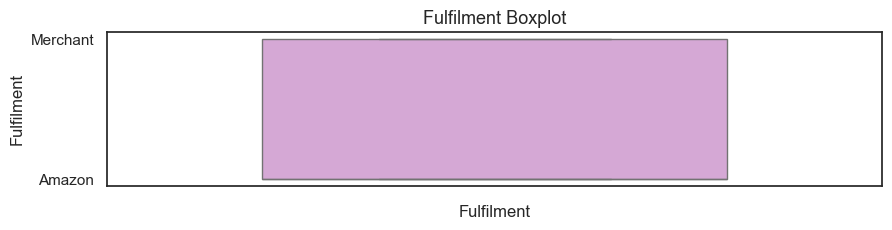

In [25]:
sns.set(style='white')
fig, ax = plt.subplots(figsize=(10, 2))
sns.boxplot(data['Fulfilment'], color="plum", width=.6)

plt.title('Fulfilment Boxplot', fontsize=13)
plt.xlabel('Fulfilment')
plt.show()

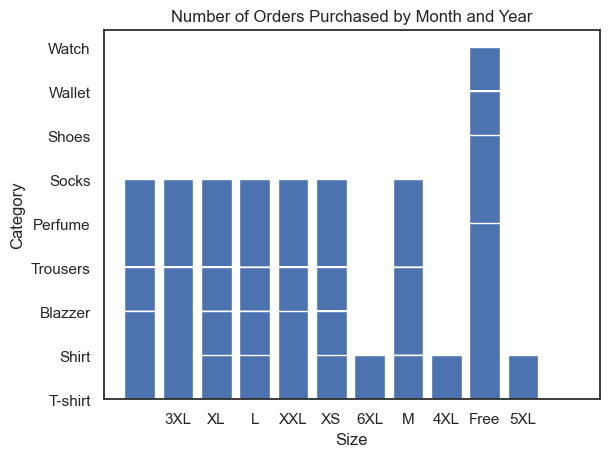

In [27]:
plt.bar(df['Size'], df['Category'])

# Set the chart title and axis labels
plt.title('Number of Orders Purchased by Month and Year')
plt.xticks([1,2,3,4,5,6,7,8,9,10,11,12])
plt.xlabel('Size')
plt.ylabel('Category')

# Rotate the x-axis labels for better readability

# Display the chart
plt.show()